In [2]:
# Imports
import numpy as np
import csv
from collections import Counter
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from IPython.display import Image
from subprocess import call

import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import export_graphviz

# Load data

In [3]:
train = pd.read_csv(os.path.join("cs5228", "train.csv"))
X_train = train.drop(["exceeds50K"], axis=1)
y_train = train["exceeds50K"]
X_test = pd.read_csv(os.path.join("cs5228", "test.csv"))
print(list(X_train.columns))
print(X_train.shape, X_test.shape)

['age', 'workclass', 'fnlwgt', 'education', 'education-num', 'marital-status', 'occupation', 'relationship', 'sex', 'capital-gain', 'capital-loss', 'hours-per-week', 'native-country']
(24421, 13) (24421, 13)


# Preprocessing

1) Drop NaN from train set (did not remove duplicates)

2) Combine capital gain and loss into one feature

3) Drop fnlweight and education

4) One-hot encoding

In [4]:
print(train.shape)
train.replace(" ?", np.nan, inplace=True)
train = train.dropna()
print(train.shape)

print(train.shape)
train["capital-gain-loss"] = train["capital-gain"] - train["capital-loss"]
train.drop(["capital-gain", "capital-loss"], axis=1, inplace=True)
train.drop(["fnlwgt", "education"], axis=1, inplace=True)
print(train.shape)

X_train = train.drop(["exceeds50K"], axis=1)
y_train = train["exceeds50K"]
X_test = pd.read_csv(os.path.join("cs5228", "test.csv"))
print(list(X_train.columns))
print(X_train.shape, X_test.shape)

# One-hot-encoding
X_train = pd.get_dummies(X_train)
print(X_train.shape)
X_train.head()

(24421, 14)
(22633, 14)
(22633, 14)
(22633, 11)
['age', 'workclass', 'education-num', 'marital-status', 'occupation', 'relationship', 'sex', 'hours-per-week', 'native-country', 'capital-gain-loss']
(22633, 10) (24421, 13)
(22633, 80)


,age,education-num,hours-per-week,capital-gain-loss,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,...,native-country_ Portugal,native-country_ Puerto-Rico,native-country_ Scotland,native-country_ South,native-country_ Taiwan,native-country_ Thailand,native-country_ Trinadad&Tobago,native-country_ United-States,native-country_ Vietnam,native-country_ Yugoslavia
1,60,13,42,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,37,13,60,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,63,10,48,7298,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,23,11,40,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
6,47,9,40,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


# Parameter optimisation: gridsearch using 5-fold CV for evaluation

In [5]:
## Create a parameter grid for gridsearch

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
n_estimators = n_estimators + [int(x) for x in np.linspace(start = 10, stop = 200, num = 20)]
# Number of features to consider at every split
max_features = ['auto', None]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(3, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200], 'max_features': ['auto', None], 'max_depth': [3, 13, 24, 35, 45, 56, 67, 77, 88, 99, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [6]:
## Use the random grid to search for best hyperparameters

# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, search across n_iter different combinations, and use all available cores
rf_gridsearch = RandomizedSearchCV(estimator=rf, param_distributions=random_grid,
                                   scoring="f1_weighted", n_iter=2000, cv=3, verbose=6, n_jobs=4, random_state=42)
# Fit the random searfch model
rf_gridsearch.fit(X_train, y_train)
# Print best parameters according to gridsearch
rf_gridsearch.best_params_

Fitting 3 folds for each of 2000 candidates, totalling 6000 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:  1.5min
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed: 15.3min
[Parallel(n_jobs=4)]: Done 105 tasks      | elapsed: 25.9min
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed: 46.2min
[Parallel(n_jobs=4)]: Done 305 tasks      | elapsed: 76.5min
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed: 130.9min
[Parallel(n_jobs=4)]: Done 605 tasks      | elapsed: 158.8min
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed: 218.0min
[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed: 277.8min
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed: 371.1min
[Parallel(n_jobs=4)]: Done 1505 tasks      | elapsed: 430.8min
[Parallel(n_jobs=4)]: Done 1792 tasks      | elapsed: 519.4min
[Parallel(n_jobs=4)]: Done 2105 tasks      | elapsed: 595.0min
[Parallel(n_jobs=4)]: Done 2442 tasks      | elapsed: 657.5min
[Parallel(n_jobs=4)]: Done 2805 tasks      | elapsed: 74

{'n_estimators': 400,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 56,
 'bootstrap': False}

In [7]:
## Evaluate improvment between the base model and the fine-tuned model

base_model = RandomForestClassifier(n_estimators=100, random_state=42)
cv_score_base = cross_val_score(base_model, X_train, y_train, cv=5, verbose=6, scoring='f1_macro')
print(cv_score_base.mean(), cv_score_base.std())

# best_model = rf_gridsearch.best_estimator_
best_params = {
   'n_estimators': 400,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 56,
 'bootstrap': False}

best_model = RandomForestClassifier(**best_params, random_state=42)
cv_score_best = cross_val_score(best_model, X_train, y_train, cv=5, verbose=6, scoring='f1_macro')
print(cv_score_best.mean(), cv_score_best.std())

print('Improvement of {:0.2f}%.'.format(100 * (cv_score_best.mean() - cv_score_base.mean()) / cv_score_base.mean()))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  ................................................................
[CV] .................................... , score=0.781, total=   2.2s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.3s remaining:    0.0s


[CV] .................................... , score=0.794, total=   2.8s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    5.1s remaining:    0.0s


[CV] .................................... , score=0.778, total=   2.7s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.8s remaining:    0.0s


[CV] .................................... , score=0.778, total=   2.8s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:   10.6s remaining:    0.0s


[CV] .................................... , score=0.770, total=   2.8s
0.7799346621048896 0.007717154197111463
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   13.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   13.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .................................... , score=0.796, total=  10.0s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   10.0s remaining:    0.0s


[CV] .................................... , score=0.817, total=   8.9s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   18.9s remaining:    0.0s


[CV] .................................... , score=0.797, total=   9.8s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   28.7s remaining:    0.0s


[CV] .................................... , score=0.800, total=  10.4s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:   39.0s remaining:    0.0s


[CV] .................................... , score=0.784, total=  10.1s
0.7988617656133857 0.010516374067173226
Improvement of 2.43%.


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   49.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   49.1s finished


# Train on whole dataset using optimised set of parameters

In [8]:
# final_model = RandomForestClassifier(**rf_gridsearch.best_params_, random_state=42)
final_model = RandomForestClassifier(**best_params, random_state=42)
final_model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=56, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=400,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

# Predict on test and save

In [9]:
X_test = pd.read_csv(os.path.join("cs5228", "test.csv"))
print(X_test.shape)
X_test.replace(" ?", np.nan, inplace=True)
# X_test = X.dropna()
X_test["capital-gain-loss"] = X_test["capital-gain"] - X_test["capital-loss"]
X_test.drop(["capital-gain", "capital-loss"], axis=1, inplace=True)
X_test.drop(["fnlwgt", "education"], axis=1, inplace=True)
print(X_test.shape)
X_test = pd.get_dummies(X_test)
X_test = X_test.drop('native-country_ Holand-Netherlands', axis=1)
X_test = X_test.drop('workclass_ Never-worked', axis=1)

print(X_train.shape, X_test.shape)

(24421, 13)
(24421, 10)
(22633, 80) (24421, 80)


In [10]:
y_test = final_model.predict(X_test)

res = {}
res["prediction"] = y_test
df = pd.DataFrame(res)
df.index.name = 'id'
df.index += 1
df.head()

,prediction
id,
1,0
2,0
3,0
4,0
5,0


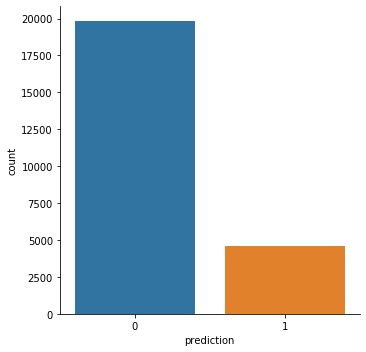

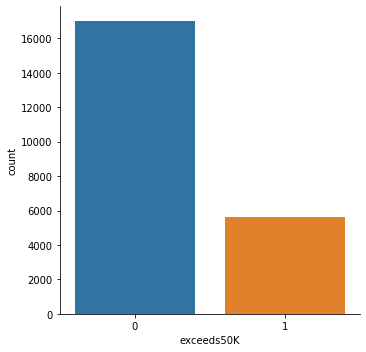

In [11]:
sns.catplot(x="prediction", kind="count", data=df)
sns.catplot(x="exceeds50K", kind="count", data=train)

In [12]:
experience = 'RF_preprocessing_WeiXin'
if not os.path.exists(os.path.join('dump', experience)):
    os.mkdir(os.path.join('dump', experience))

X_train.to_csv(os.path.join('dump', experience, 'X_train.csv'))
X_test.to_csv(os.path.join('dump', experience, 'X_test.csv'))
pickle.dump(final_model, open(os.path.join('dump', experience, 'model'), 'wb'))
df.to_csv(os.path.join('dump', experience, experience+'.csv'))

# Features importance

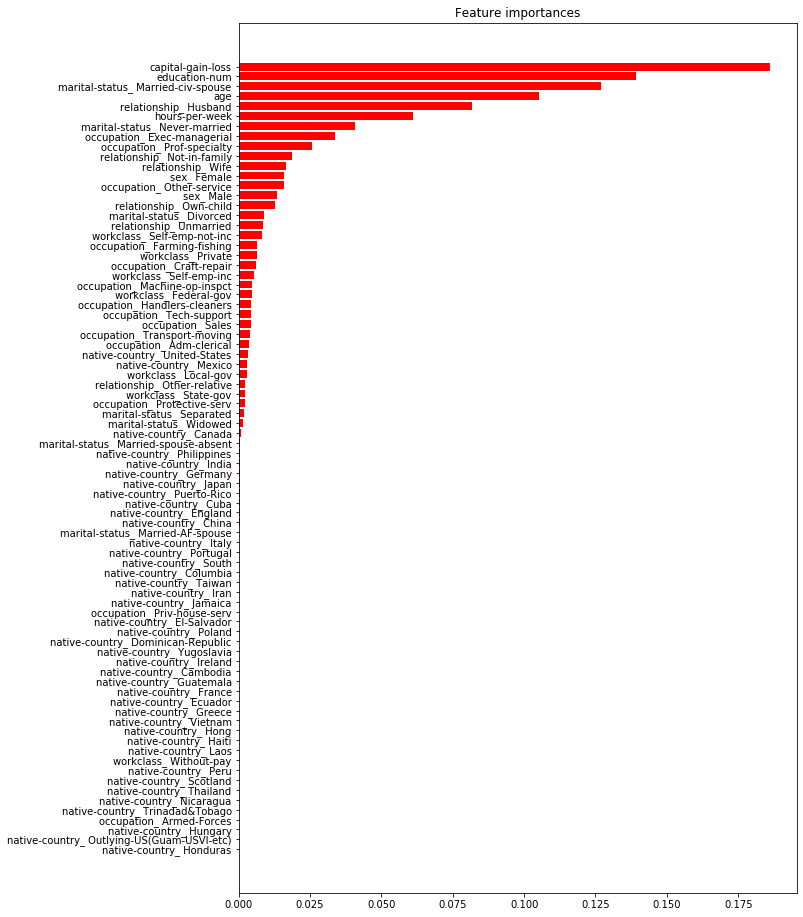

In [14]:
importances = final_model.feature_importances_
indices = np.argsort(importances)[::-1]
colnames = list(X_train)

fig, ax = plt.subplots(1, 1, figsize=(10,16))
ax.set_title("Feature importances")
ax.barh(range(len(colnames)), importances[indices[::-1]],
        color="r", align="center")
ax.set_yticks(range(len(colnames)))
ax.set_yticklabels(np.array(colnames)[indices][::-1])
plt.show()

In [15]:
# final_model = pickle.load(open(os.path.join('dump', 'RF_simpleonehotencodingonly', 'model'), 'rb'))
# Export as dot file
export_graphviz(final_model.estimators_[5], 
                out_file=os.path.join('dump', experience, 'tree.dot'), 
                feature_names = X_train.columns, class_names = ["not exceeds 50K", "exceeds 50K"],
                rounded = True, proportion = False, precision = 2, filled = True)
# Convert to png
call(['dot', '-Tpng', os.path.join('dump', experience, 'tree.dot'),
      '-o', os.path.join('dump', experience, 'tree.png'), '-Gdpi=600'])
# Display in jupyter notebook
Image(filename = os.path.join('dump', experience, 'tree.png'))